In [1]:
import sys
import os
sys.path.append(os.path.abspath(".."))
sys.path.append(os.path.abspath("."))

In [2]:
import utils_io
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import yaml
import json
import torch
from tqdm.notebook import tqdm
# --- Import our custom modules ---
# Use autoreload to pick up changes in .py files without restarting kernel
%load_ext autoreload
%autoreload 2


# --- Matplotlib Aesthetics Settings ---
plt.rcParams.update({
    "figure.dpi": 300,
    "savefig.dpi": 300,
    "font.family": "serif",
    "axes.titlesize": 18,
    "axes.labelsize": 16,
    "legend.fontsize": 12,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "axes.edgecolor": "black",
    "axes.linewidth": 1,
    'grid.alpha': 0.5,
    'grid.color': '#c0c0c0',
    'grid.linestyle': '--',
    'grid.linewidth': 0.8,
    'figure.dpi': 300,
    'figure.edgecolor': 'black',
    'figure.facecolor': 'white',
    'figure.figsize': [6, 5],
})

# Load all seeds for 'diag' structure
data_diag = utils_io.load_results_from_dir('results/study_q2approx_v1/sequential')

# (You'll need logic to separate 'diag' from 'block' folders if they are in same parent,
# or save them in different parents like results/exp_diag/seed_x)

Directory not found: results/study_q2approx_v1/sequential


In [27]:
# Metrics from task_metrics['landscape']
L_metrics = [
    "sharpness_curr", "trace_curr", 
    "grad_norm_reg", "grad_norm_task", "reg_rank"
]

M_metrics = ['kappa_loss', 'kappa_grad', 'grad_cos_sim']

# Metrics from task_metrics['performance'] (Live training stats)
P_metrics = ["avg_task_loss", "avg_reg_loss", "train_batch_acc"]

# Metrics from task_metrics['performance'] (Nested Systematic Eval)
# Format: {split}_{category}
G_metrics = [
    "test_current", "test_avg_past", "test_avg_future", "test_avg_total",
    "train_current", "train_avg_past", "train_avg_future", "train_avg_total"
]

In [4]:
ROOT_DIR = './results/study_q2approx_v1'

In [5]:
def filter_index(index, filters):
    """
    General-purpose filter for experiment results.
    Args:
        index (list): List of experiment dicts.
        filters (dict): Key-value pairs to match. 
                        e.g. {'mode': 'regularized', 'spectral_override': True}
    """
    matches = []
    for item in index:
        is_match = True
        cfg = item.get('config', {})
        
        for key, target_val in filters.items():
            # 1. Try finding key in top-level item (metrics.pt metadata)
            # 2. Try finding key in item['config'] (original config.json)
            # 3. Default to None if not found
            found_val = item.get(key, cfg.get(key, None))
            
            # Special handling for booleans (missing often implies False)
            if target_val is False and found_val is None:
                found_val = False
            
            # Comparison
            # We convert to string for robust comparison (e.g. if one is '1.0' and other is 1.0)
            # but usually direct comparison is fine.
            if found_val != target_val:
                is_match = False
                break
        
        if is_match:
            matches.append(item)
            
    return matches

In [56]:
def get_experiment_index(root_dir):
    configs = []
    files = glob.glob(os.path.join(root_dir, '**', 'config.yaml'), recursive=True)
    
    print(f"Indexing {len(files)} experiments...")
    for f in files:
        try:
            with open(f, 'r') as stream:
                cfg = yaml.safe_load(stream)
            
            configs.append({
                'config': cfg,
                'metrics_path': os.path.join(os.path.dirname(f), 'metrics.pt'),
                'mode': cfg.get('training_mode', 'unknown'),
                'reg_type': cfg.get('reg_type'),
                'seed': cfg.get('seed'),
                'curvature': cfg.get('curvature_type', 'fisher'),
                'accumulate': cfg.get('accumulate', False),
                'data_relationship': cfg.get('data_relationship', 'independent') , 
                'ignore_gradient': cfg.get('ignore_gradient', False),
                'spectral_override': cfg.get('spectral_override', False),
                'alpha': cfg.get('alpha', 1.0),
                'projection': cfg.get('projection', False),
                'reg_frac': cfg.get('reg_frac', 1.0),
                'replay_frac': cfg.get('replay_frac', 0.0)
            })
        except Exception: continue
    return configs

In [57]:
def extract_trajectory_series(results, config, metric_root):
    num_steps = config['num_steps']
    num_tasks = config['environment_args']['num_tasks']
    steps_axis, vals_stale, vals_fresh = [], [], []

    for t in range(num_tasks):
        if t not in results: continue
        task_data = results[t]
        offset = t * num_steps

        # 1. Route to the correct data bucket
        if any(k in metric_root for k in ['kappa', 'cos_sim']):
            bucket = 'history'
        elif any(k in metric_root for k in ['sharpness', 'grad_norm']):
            bucket = 'landscape'
        else:
            bucket = 'performance'

        data_list = task_data.get(bucket, [])
        for i, entry in enumerate(data_list):
            # --- A. Step Calculation ---
            if bucket == 'performance':
                step = entry.get('step', 0) + offset
            elif bucket == 'landscape':
                l_int = config.get('log_every_n_steps', 1) * config.get('landscape_interval', 1)
                step = (i * l_int) + offset
            else: # History
                step = (i + 1) + offset

            # --- B. Value Extraction ---
            v_s, v_f = np.nan, np.nan

            if bucket == 'history':
                # entry is a LIST of sample dicts. Average them.
                # Kappa metrics have _acc and _res versions
                v_s = np.mean([s.get(f"{metric_root}_acc", np.nan) for s in entry])
                v_f = np.mean([s.get(f"{metric_root}_res", np.nan) for s in entry])
            
            elif bucket == 'performance':
                # Handle nesting like 'test_avg_past' -> entry['test']['avg_past']
                if '_' in metric_root:
                    parts = metric_root.split('_')
                    # e.g., 'test', 'avg', 'past'
                    top_key = parts[0] # 'test'
                    sub_key = "_".join(parts[1:]) # 'avg_past'
                    val = entry.get(top_key, {}).get(sub_key, np.nan)
                else:
                    val = entry.get(metric_root, np.nan)
                
                # Performance metrics are the same for stale/fresh rows
                v_s, v_f = val, val

            elif bucket == 'landscape':
                val = entry.get(metric_root, np.nan)
                v_s, v_f = val, val

            steps_axis.append(step)
            vals_stale.append(v_s)
            vals_fresh.append(v_f)

    return np.array(steps_axis), np.array(vals_stale), np.array(vals_fresh)

## Approximation errors for different approximations 

In [8]:
def plot_trajectory_on_ax(ax, results, config, sample_ids='mean', metric_root='kappa_loss', use_abs=True):
    """
    Draws trajectory lines on a given axis.
    
    Args:
        metric_root: 'kappa_loss', 'kappa_grad', 'cos_sim'
        sample_ids: List of ints OR 'mean' to plot average with std band.
    """
    num_tasks = config['environment_args']['num_tasks']
    num_steps = config['num_steps']
    
    # Define metric keys based on root
    key_acc = f"{metric_root}_acc"
    key_res = f"{metric_root}_res"
    
    steps_axis = []
    
    # Containers for data aggregation
    # structure: [step_index] -> list of values (one per sample)
    data_acc = [] 
    data_res = []
    
    curr_step = 0
    
    # --- 1. Extract Data ---
    for t in range(1, num_tasks):
        if t not in results or 'history' not in results[t]:
            # Add placeholders or skip
            curr_step += num_steps
            continue
            
        history = results[t]['history']
        task_x = np.linspace(0, num_steps, len(history))
        
        for i, step_data in enumerate(history):
            steps_axis.append(curr_step + task_x[i])
            
            vals_a = []
            vals_r = []
            
            # Helper to safely extract and optionally apply abs
            def get_val(sample_dict, k):
                val = sample_dict.get(k, np.nan)
                if use_abs and not np.isnan(val):
                    return abs(val)
                return val

            # Extraction Logic
            if isinstance(sample_ids, list):
                for s_id in sample_ids:
                    if len(step_data) > s_id:
                        vals_a.append(get_val(step_data[s_id], key_acc))
                        vals_r.append(get_val(step_data[s_id], key_res))
            
            elif sample_ids == 'mean':
                for sample_stat in step_data:
                    vals_a.append(get_val(sample_stat, key_acc))
                    vals_r.append(get_val(sample_stat, key_res))
            
            data_acc.append(vals_a)
            data_res.append(vals_r)

        curr_step += num_steps

    if not steps_axis: return

    if isinstance(sample_ids, list):
        # --- Plot Individual Samples ---
        cmap_acc = plt.cm.Reds
        cmap_res = plt.cm.Blues
        colors_acc = cmap_acc(np.linspace(0.5, 1, len(sample_ids)))
        colors_res = cmap_res(np.linspace(0.5, 1, len(sample_ids)))
        
        # We need to transpose data: [steps][samples] -> [samples][steps]
        # Using numpy for easy slicing, padding with nan if lengths differ
        # (Simplified loop since we built flat lists above, but we need structure)
        
        # Re-looping for plotting simply:
        # Since aggregating data_acc is jagged (diff samples per step possible), 
        # we'll plot point-by-point or rebuild the structure. 
        # Actually, simpler to just iterate extraction logic again or restructure data_acc.
        # Let's use the simplest approach: Re-extract per sample ID.
        
        # (Redoing loop for clarity/robustness with Matplotlib lines)
        # Re-extract just for clean plotting loop (simplified)
        curr_step = 0
        for idx, s_id in enumerate(sample_ids):
            s_steps = []
            s_vals_a = []
            s_vals_r = []
            curr_step = 0
            for t in range(1, num_tasks):
                history = results.get(t, {}).get('history', [])
                task_x = np.linspace(0, num_steps, len(history))
                for i, step_data in enumerate(history):
                    if len(step_data) > s_id:
                        s_steps.append(curr_step + task_x[i])
                        # Apply abs if requested
                        va = step_data[s_id].get(key_acc, np.nan)
                        vr = step_data[s_id].get(key_res, np.nan)
                        if use_abs:
                            va = abs(va) if not np.isnan(va) else va
                            vr = abs(vr) if not np.isnan(vr) else vr
                        s_vals_a.append(va)
                        s_vals_r.append(vr)
                curr_step += num_steps
            
            ax.plot(s_steps, s_vals_a, color=colors_acc[idx], ls='-', lw=1.5, alpha=0.8)
            ax.plot(s_steps, s_vals_r, color=colors_res[idx], ls='--', lw=1.5, alpha=0.8)

    elif sample_ids == 'mean':
        # --- Plot Average with Shaded Std Dev ---
        # Note: Values are already abs() inside data_acc/data_res if use_abs=True
        
        means_acc = np.array([np.nanmean(v) for v in data_acc])
        stds_acc  = np.array([np.nanstd(v) for v in data_acc])
        
        means_res = np.array([np.nanmean(v) for v in data_res])
        stds_res  = np.array([np.nanstd(v) for v in data_res])
        
        ax.plot(steps_axis, means_acc, color='darkred', ls='-', lw=2, label='Accum Mean')
        ax.plot(steps_axis, means_res, color='darkblue', ls='--', lw=2, label='Reset Mean')
        
        ax.fill_between(steps_axis, means_acc - stds_acc, means_acc + stds_acc, color='red', alpha=0.15)
        ax.fill_between(steps_axis, means_res - stds_res, means_res + stds_res, color='blue', alpha=0.15)
        
        # Heuristic Y-Limit for Error Plots
        if use_abs: 
            pass
            # ax.set_ylim(0, max(np.nanmax(means_res), np.nanmax(means_acc)) * 1.5)

    # Boundaries & Grid
    for t in range(1, num_tasks):
        ax.axvline(x=t * num_steps, color='gray', linestyle=':', alpha=0.3)

    # Dynamic Limits based on metric type
    if 'cos_sim' in metric_root:
        ax.set_ylim(-1.1, 1.1) # Cosine sim is bounded
    else:
        # Heuristic limits for Kappa errors which can explode
        # ax.set_ylim(min(-1, plot_y_min), min(plot_y_max * 1.2, 50.0))
        pass

    ax.grid(True, linestyle=':', alpha=0.5)

def plot_grid(root_dir, metric='kappa_loss', sample_ids='mean', seed_to_plot=42, 
              curvature='hessian', ignore_gradient=False, use_abs=None):
    """
    Plots a grid of results (Modes x RegTypes).
    
    Args:
        curvature (str): 'hessian' or 'fisher'
        ignore_gradient (bool): True to see experiments where g*delta was dropped.
    """
    
    # Auto-detect absolute value
    if use_abs is None:
        use_abs = True if 'kappa' in metric else False

    index = get_experiment_index(root_dir)
    
    modes = ['sequential', 'regularized', 'replay']
    reg_types = ['taylor-diag', 'taylor-block', 'taylor-full']
    
    rows, cols = len(modes), len(reg_types)
    fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 4*rows), dpi=150, sharex=True, sharey=False)
    
    if rows == 1 and cols == 1: axes = np.array([[axes]])
    elif rows == 1: axes = axes[np.newaxis, :]
    elif cols == 1: axes = axes[:, np.newaxis]

    grad_status = "NoGrad" if ignore_gradient else "WithGrad"
    print(f"Plotting {metric} | {curvature} | {grad_status} | Seed {seed_to_plot}")

    for r, mode in enumerate(modes):
        for c, reg in enumerate(reg_types):
            ax = axes[r, c]
            
            # --- FILTERING LOGIC ---
            match = None
            for item in index:
                if (item['mode'] == mode and 
                    item['reg_type'] == reg and 
                    item['seed'] == seed_to_plot and 
                    item['curvature'] == curvature and 
                    item.get('ignore_gradient', False) == ignore_gradient): # <--- NEW FILTER
                    
                    match = item
                    break
            
            if match:
                try:
                    results = torch.load(match['metrics_path'], map_location='cpu', weights_only=False)
                    config = match['config']
                    plot_trajectory_on_ax(ax, results, config, sample_ids=sample_ids, metric_root=metric, use_abs=use_abs)
                    
                    if r == 0: ax.set_title(f"{reg}", fontsize=14)
                    if c == 0: ax.set_ylabel(f"{mode}\n{metric}", fontsize=12)
                except Exception as e:
                    ax.text(0.5, 0.5, f"Error: {e}", ha='center', transform=ax.transAxes, fontsize=8)
            else:
                ax.text(0.5, 0.5, "No Data", ha='center', transform=ax.transAxes, color='gray')
                if r == 0: ax.set_title(f"{reg}")
                if c == 0: ax.set_ylabel(f"{mode}")

    # Legend
    from matplotlib.lines import Line2D
    custom_lines = [
        Line2D([0], [0], color='darkred', lw=2, linestyle='-'),
        Line2D([0], [0], color='darkblue', lw=2, linestyle='--')
    ]
    fig.legend(custom_lines, ['Accumulate (Robust)', 'Reset (Unstable)'], 
               loc='upper center', bbox_to_anchor=(0.5, 1.02), ncol=2, fontsize=12)
    
    plt.tight_layout()
    plt.show()

Indexing 138 experiments...
Plotting kappa_loss | true_fisher | NoGrad | Seed 33


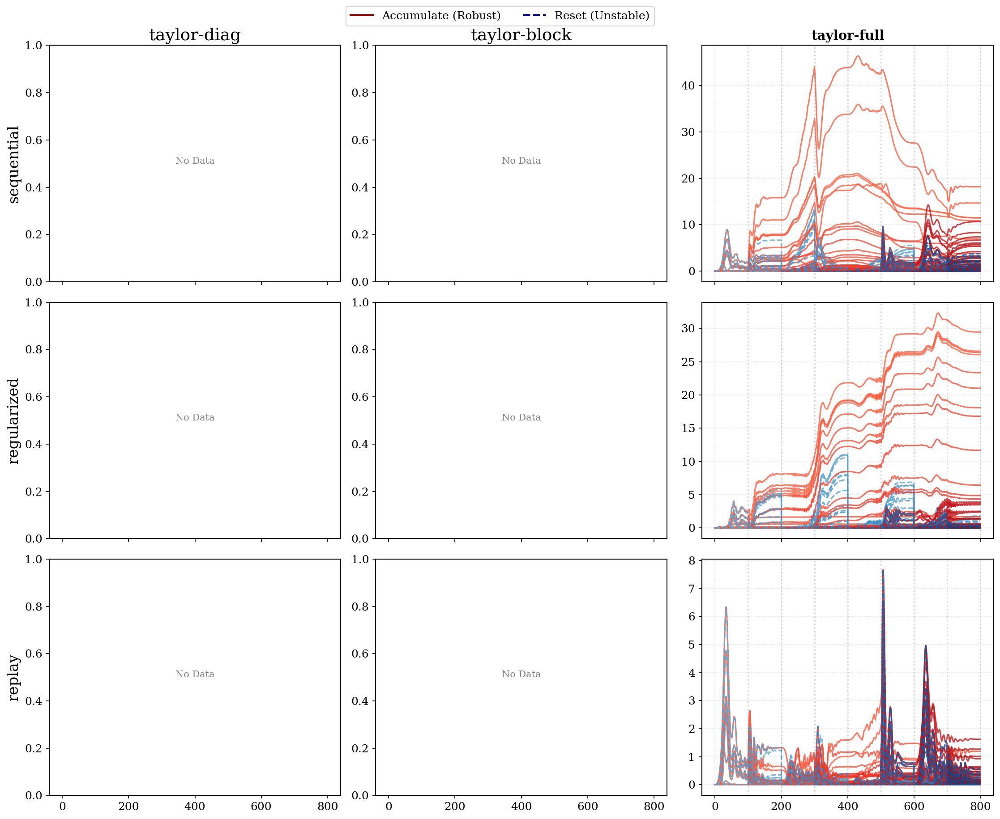

In [8]:
# 1. Average Kappa Error (All Samples)
samples = list(range(100))
# plot_grid(ROOT_DIR, metric='kappa_loss', sample_ids=samples, seed_to_plot=33, 
            #   curvature='hessian', use_abs=True, ignore_gradient=False)
plot_grid(ROOT_DIR, metric='kappa_loss', sample_ids=samples, seed_to_plot=33, 
              curvature='true_fisher', use_abs=True, ignore_gradient=True)

# # 2. Individual Samples - Gradient Norm Error
# plot_grid(ROOT_DIR, metric='kappa_grad', sample_ids=[0, 10, 20])

# # 3. Average Cosine Similarity
# plot_grid(ROOT_DIR, metric='cos_sim', sample_ids='mean')

In [9]:
def plot_metric_comparison(root_dir, 
                           metric='kappa_loss', 
                           compare_by='reg_type', 
                           filters={}, # Generalized filters input
                           strategy='accumulate', 
                           sample_ids='mean'):
    """
    Plots a comparison of aggregated trajectories.
    
    Args:
        compare_by: The key to group by (e.g., 'reg_type', 'ignore_gradient').
        filters: Dictionary of fixed parameters to filter by (e.g. {'curvature': 'fisher'}).
    """
    
    index = get_experiment_index(root_dir)
    
    # 1. Prepare Filters
    # Critical: We must remove the 'compare_by' key from the filters if it exists.
    # Otherwise, we would filter down to a single value and have nothing to compare.
    selection_filters = filters.copy()
    if compare_by in selection_filters:
        print(f"  [Plot] Removing '{compare_by}' from filters to enable comparison.")
        del selection_filters[compare_by]

    # 2. Apply Filters using the generalized helper
    relevant_exps = filter_index(index, selection_filters)

    if not relevant_exps:
        print(f"No experiments found matching filters: {selection_filters}")
        return

    # 3. Grouping
    groups = {}
    for item in relevant_exps:
        # Get the value for the comparison key
        # We look in top-level or config
        key = item.get(compare_by, item.get('config', {}).get(compare_by, 'unknown'))
        
        # Handle boolean keys nicely for labels (e.g. ignore_gradient)
        if isinstance(key, bool) and compare_by == 'ignore_gradient':
            key = "No Gradient" if key else "With Gradient"
            
        if key not in groups: groups[key] = []
        groups[key].append(item)
        
    # 4. Plotting
    fig, ax = plt.subplots(figsize=(10, 6), dpi=150)
    
    # Sort keys for consistent coloring
    # Convert mixed types to string for sorting safety
    unique_keys = sorted(groups.keys(), key=lambda x: str(x))
    colors = plt.cm.tab10(np.linspace(0.0, 1.0, len(unique_keys)))
    
    print(f"Comparing '{compare_by}' across {len(unique_keys)} groups...")

    for idx, group_key in enumerate(unique_keys):
        seed_items = groups[group_key]
        color = colors[idx]
        
        acc_list = []
        res_list = []
        steps_ref = None
        
        for m in seed_items:
            try:
                res = torch.load(m['metrics_path'], map_location='cpu', weights_only=False)
                cfg = m['config']
                
                # Determine if metric requires absolute value (for errors/diffs)
                use_abs = True if 'kappa' in metric else False
                
                # Extract Trajectory
                steps, v_acc, v_res = extract_trajectory_series(
                    res, cfg, metric, sample_ids, use_abs
                )
                
                # Alignment check
                if steps_ref is None: steps_ref = steps
                elif len(steps) != len(steps_ref):
                    mn = min(len(steps), len(steps_ref))
                    steps = steps[:mn]; v_acc = v_acc[:mn]; v_res = v_res[:mn]
                    steps_ref = steps_ref[:mn]
                    acc_list = [x[:mn] for x in acc_list]
                    res_list = [x[:mn] for x in res_list]

                acc_list.append(v_acc)
                res_list.append(v_res)
            except Exception as e: 
                continue
            
        if not acc_list: continue
        
        # Compute Stats
        mean_acc = np.nanmean(np.vstack(acc_list), axis=0)
        mean_res = np.nanmean(np.vstack(res_list), axis=0)
        
        # Plot Accumulate (Solid)
        if strategy in ['accumulate', 'both']:
            label = f"{group_key}" if strategy == 'accumulate' else f"{group_key} (Accum)"
            ax.plot(steps_ref, mean_acc, color=color, ls='-', lw=2, label=label)
            
            if len(seed_items) > 1:
                std_acc = np.nanstd(np.vstack(acc_list), axis=0)
                ax.fill_between(steps_ref, mean_acc-std_acc, mean_acc+std_acc, color=color, alpha=0.1)
            
        # Plot Reset (Dashed)
        if strategy in ['reset', 'both']:
            label = f"{group_key}" if strategy == 'reset' else f"{group_key} (Reset)"
            ax.plot(steps_ref, mean_res, color=color, ls='--', lw=2, label=label)
            
            if len(seed_items) > 1 and strategy == 'reset':
                std_res = np.nanstd(np.vstack(res_list), axis=0)
                ax.fill_between(steps_ref, mean_res-std_res, mean_res+std_res, color=color, alpha=0.1)
                
    # 5. Formatting
    filter_str = ', '.join([f"{k}={v}" for k, v in selection_filters.items()])
    ax.set_title(f"Comparison of {metric} by {compare_by}\n(Filters: {filter_str})", fontsize=12)
    ax.set_ylabel(metric + (" (MAE)" if 'kappa' in metric else ""))
    ax.set_xlabel("Global Steps")
    
    # Task Boundaries
    if unique_keys:
        # Grab config from the first valid experiment found
        sample_cfg = groups[unique_keys[0]][0]['config']
        num_tasks = sample_cfg['environment_args']['num_tasks']
        num_steps = sample_cfg['num_steps']
        for t in range(1, num_tasks):
            ax.axvline(x=t*num_steps, color='gray', linestyle=':', alpha=0.3)
        
    ax.grid(True, alpha=0.3)
    # Move legend outside to avoid clutter
    ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0.)
    plt.tight_layout()
    plt.show()

Indexing 189 experiments...
Comparing 'accumulate' across 2 groups...


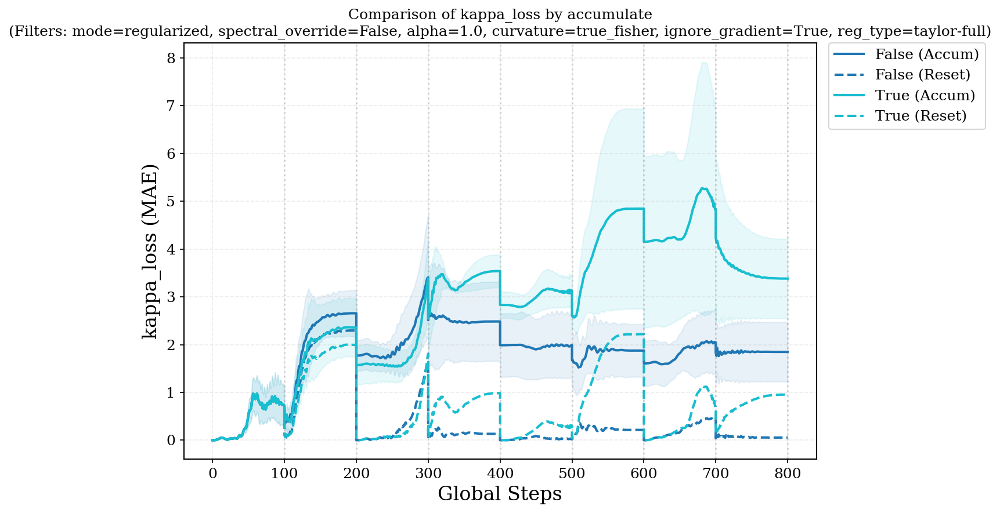

In [32]:
plot_metric_comparison(
    ROOT_DIR, 
    metric='kappa_loss',
    compare_by='accumulate', # Compare threshold 0.99 vs 0.999
    filters={
        'mode': 'regularized',
        'spectral_override': False,
        'alpha': 1.0,
        'curvature': 'true_fisher', 
        'ignore_gradient':True, 
        'reg_type': 'taylor-full'
    }, 
    strategy='both'
)

Indexing 178 experiments...
Comparing 'reg_type' across 3 groups...


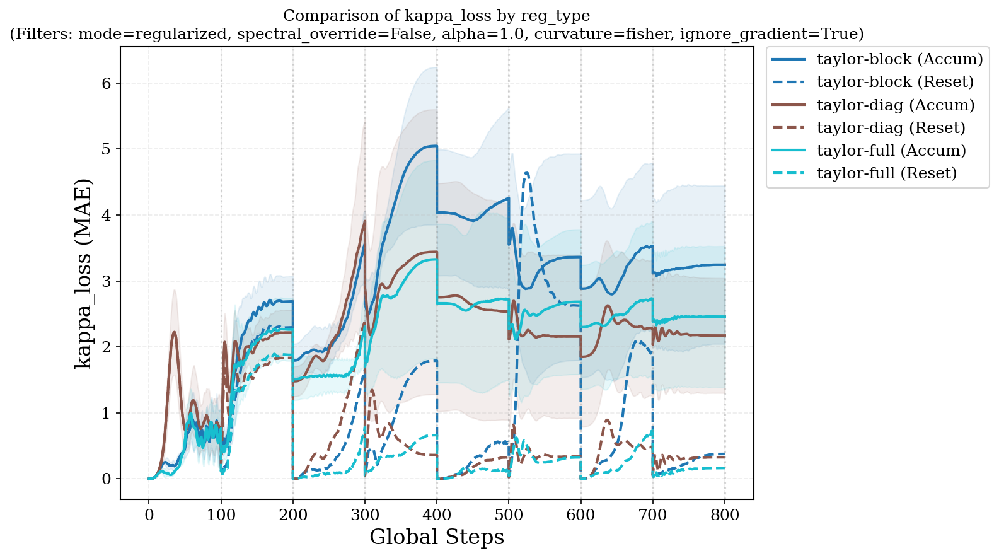

In [11]:
plot_metric_comparison(
    ROOT_DIR, 
    metric='kappa_loss',
    compare_by='reg_type', # Compare threshold 0.99 vs 0.999
    filters={
        'mode': 'regularized',
        'spectral_override': False,
        'alpha': 1.0,
        'curvature': 'fisher', 
        'ignore_gradient':True, 
    }, 
    strategy='both'
)

Indexing 178 experiments...
Comparing 'reg_type' across 3 groups...


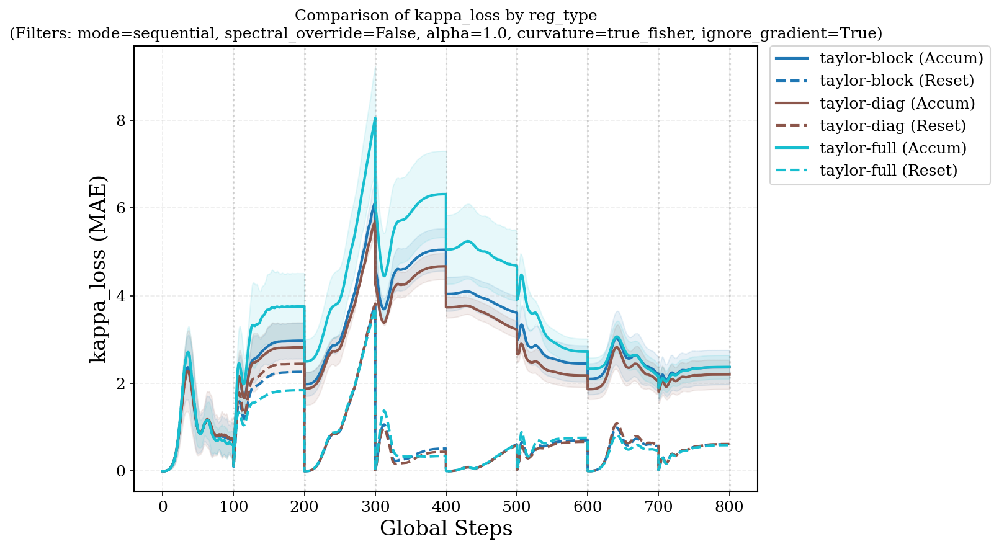

In [13]:
plot_metric_comparison(
    ROOT_DIR, 
    metric='kappa_loss',
    compare_by='reg_type', # Compare threshold 0.99 vs 0.999
    filters={
        'mode': 'sequential',
        'spectral_override': False,
        'alpha': 1.0,
        'curvature': 'true_fisher', 
        'ignore_gradient':True, 
    }, 
    strategy='both'
)

Indexing 178 experiments...
Comparing 'reg_type' across 3 groups...


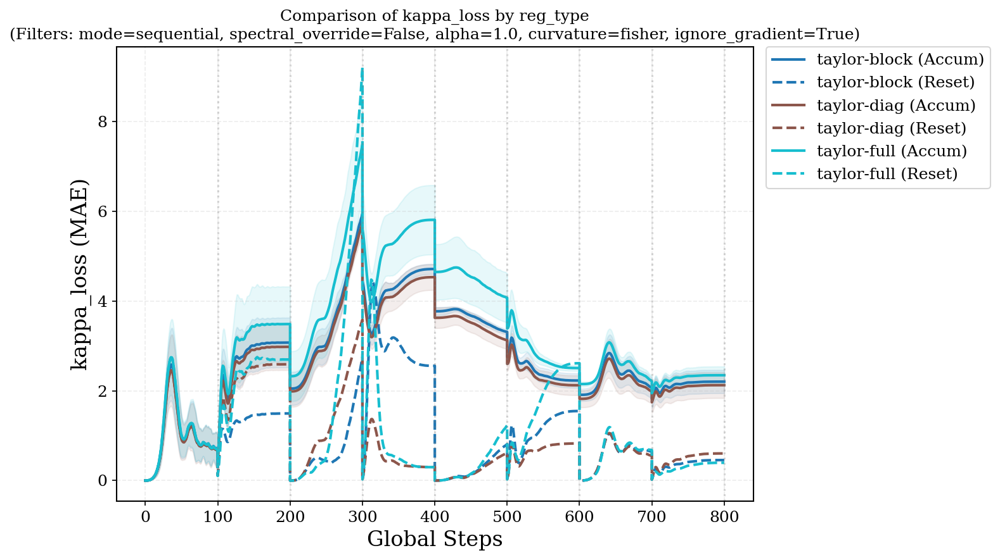

In [12]:
plot_metric_comparison(
    ROOT_DIR, 
    metric='kappa_loss',
    compare_by='reg_type', # Compare threshold 0.99 vs 0.999
    filters={
        'mode': 'sequential',
        'spectral_override': False,
        'alpha': 1.0,
        'curvature': 'fisher', 
        'ignore_gradient':True, 
    }, 
    strategy='both'
)

In [10]:
def plot_summary_boxplot(root_dir, 
                         metric='kappa_loss', 
                         compare_by='reg_type', 
                         filters={}, # <--- Generalized
                         sample_ids='mean',
                         use_abs=None):
    """
    Collapses the entire training trajectory into a single scalar (Average) per seed
    and plots the distribution across experiments using Box Plots.
    
    Args:
        compare_by (str): Variable for X-axis (e.g., 'reg_type', 'alpha', 'spectral_threshold').
        filters (dict): Dictionary of fixed parameters to filter by (e.g. {'curvature': 'fisher'}).
    """
    
    # 1. Auto-detect Absolute Value
    if use_abs is None:
        use_abs = True if 'kappa' in metric else False
        
    # 2. Prepare Filters
    index = get_experiment_index(root_dir)
    
    # Remove the comparison variable from filters to allow all values to pass through
    selection_filters = filters.copy()
    if compare_by in selection_filters:
        print(f"  [Plot] Removing '{compare_by}' from filters to enable comparison.")
        del selection_filters[compare_by]
    
    # 3. Apply Filters
    relevant_exps = filter_index(index, selection_filters)
            
    if not relevant_exps:
        print(f"No experiments found matching filters: {selection_filters}")
        return

    # 4. Data Collection Loop
    records = []
    print(f"Aggregating {len(relevant_exps)} experiments...")
    
    for item in relevant_exps:
        try:
            # Load Data
            res = torch.load(item['metrics_path'], map_location='cpu', weights_only=False)
            cfg = item['config']
            
            # Extract Time Series (Steps x 1)
            steps, v_acc, v_res = extract_trajectory_series(
                res, cfg, metric, sample_ids, use_abs
            )
            
            # COLLAPSE TIME: Compute Global Mean for this seed
            mean_acc = np.nanmean(v_acc)
            mean_res = np.nanmean(v_res)
            
            # Handle Group Label
            # Look in item first (top-level), then config
            label = item.get(compare_by, cfg.get(compare_by, 'Unknown'))
            
            # Convert bools to strings for readable plotting
            if isinstance(label, bool):
                if compare_by == 'ignore_gradient':
                    label = "No Gradient" if label else "With Gradient"
                else:
                    label = str(label)
            
            # Ensure label is string for sorting consistency
            label = str(label)
            
            # Append Records
            records.append({
                'Group': label,
                'Strategy': 'Accumulate',
                'Value': mean_acc,
                'Seed': item.get('seed', 0)
            })
            
            records.append({
                'Group': label,
                'Strategy': 'Reset',
                'Value': mean_res,
                'Seed': item.get('seed', 0)
            })
            
        except Exception as e:
            continue

    if not records:
        print("No valid data extracted.")
        return

    # 5. Create DataFrame
    df = pd.DataFrame(records)
    
    # Sort groups
    try:
        # Try numeric sort if possible, else string sort
        df['Group_Numeric'] = pd.to_numeric(df['Group'], errors='coerce')
        if df['Group_Numeric'].notna().all():
            df = df.sort_values(by='Group_Numeric')
        else:
            df = df.sort_values(by='Group')
    except: pass

    # 6. Plotting
    plt.figure(figsize=(10, 6), dpi=150)
    
    # A. The Box Plot (Distribution)
    sns.boxplot(
        data=df, 
        x='Group', 
        y='Value', 
        hue='Strategy',
        palette={'Accumulate': "#e3cf4f", 'Reset': "#b4da77"},
        showfliers=False, 
        gap=0.1
    )
    
    # B. The Strip Plot (Individual Seeds)
    sns.stripplot(
        data=df, 
        x='Group', 
        y='Value', 
        hue='Strategy',
        palette={'Accumulate': "#8c7a00", 'Reset': "#5e7d2f"}, # Darker version for dots
        dodge=True, 
        jitter=True, 
        alpha=0.6,
        legend=False
    )

    # Styling
    filter_str = ', '.join([f"{k}={v}" for k, v in selection_filters.items()])
    plt.title(f"Average {metric} Distribution by {compare_by}\n(Filters: {filter_str})")
    plt.ylabel(f"Global Average {metric}" + (" (MAE)" if use_abs else ""))
    plt.xlabel(compare_by.replace('_', ' ').title())
    plt.grid(True, axis='y', alpha=0.3)
    
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Approximation')
    plt.tight_layout()
    plt.show()

### Plot specific experiments

In [11]:
def plot_specific_experiment(root_dir, 
                             metrics_to_plot, # List of keys
                             filters={},      # <--- Generalized Filters
                             seed=None,       # Specific seed override
                             # Styling
                             colors=None,
                             linestyles=None,
                             smooth_window=1,
                             log_scale=False):
    """
    Plots multiple specific quantities for a single experiment configuration.
    Useful for debugging dynamics (e.g. Gradients vs Sharpness).
    """
    
    # 1. Prepare Filters
    index = get_experiment_index(root_dir)
    matches = filter_index(index, filters)
    
    # Filter by seed explicitly if needed
    if seed is not None:
        matches = [m for m in matches if m.get('seed') == seed]
            
    if not matches:
        print(f"No experiments found for filters: {filters}")
        return

    print(f"Plotting metrics {metrics_to_plot} for {len(matches)} seeds...")

    # 2. Setup Plot
    fig, ax = plt.subplots(figsize=(8, 6), dpi=300)
    
    # Defaults
    if colors is None: colors = plt.cm.tab10(np.linspace(0, 1, len(metrics_to_plot)))
    if linestyles is None: linestyles = ['-'] * len(metrics_to_plot)

    # 3. Extract and Plot Each Metric
    for idx, metric_key in enumerate(metrics_to_plot):
        color = colors[idx]
        ls = linestyles[idx % len(linestyles)]
        
        all_series = []
        steps_ref = None
        
        for m in matches:
            try:
                res = torch.load(m['metrics_path'], map_location='cpu', weights_only=False)
                # Helper uses your logic for 'landscape' vs 'performance' vs 'history'
                steps, vals = extract_metric_series(res, m['config'], metric_key)
                
                if steps_ref is None: steps_ref = steps
                elif len(steps) == len(steps_ref): all_series.append(vals)
            except Exception as e: 
                continue
        
        if not all_series: continue
        
        # Stats
        mat = np.vstack(all_series)
        mean_line = np.nanmean(mat, axis=0)
        
        # Smoothing
        if smooth_window > 1:
            kernel = np.ones(smooth_window)/smooth_window
            mean_line = np.convolve(mean_line, kernel, mode='same')
            
        # Plot
        ax.plot(steps_ref, mean_line, label=metric_key, color=color, linestyle=ls, lw=2)
        
        # Shading
        if seed is None and len(matches) > 1:
            std_line = np.nanstd(mat, axis=0)
            if smooth_window > 1:
                std_line = np.convolve(std_line, kernel, mode='same')
            ax.fill_between(steps_ref, mean_line-std_line, mean_line+std_line, color=color, alpha=0.1)

    # 4. Formatting
    # Create title from filters
    title_parts = [f"{k}={v}" for k, v in filters.items()]
    # Truncate title if too long
    if len(title_parts) > 3:
        title_str = " | ".join(title_parts[:3]) + "..."
    else:
        title_str = " | ".join(title_parts)
        
    ax.set_title(f"Dynamics: {title_str}", fontsize=10)
    ax.set_xlabel("Steps")
    ax.set_ylabel("Value")
    if log_scale: ax.set_yscale('log')
    
    # Task Boundaries
    if matches:
        cfg = matches[0]['config']
        num_tasks = cfg['environment_args']['num_tasks']
        num_steps = cfg['num_steps']
        for t in range(1, num_tasks):
            ax.axvline(x=t*num_steps, color='gray', ls=':', alpha=0.5)

    # ax.set_ylim(0.6,0.9)
    ax.legend()
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# Your specific helper (assumes L_metrics and P_metrics are globally defined)
def extract_metric_series(results, config, key):
    steps_axis = []
    values = []
    curr_step = 0
    num_steps = config['num_steps']
    
    # Logic to determine where the metric lives
    if key in L_metrics: 
        keyword = 'landscape'
    elif key in P_metrics:
        keyword = "performance"
    else: 
        keyword = 'history'
    
    for t in sorted(results.keys()):
        if keyword not in results[t]: 
            curr_step += num_steps
            continue
        
        # Check if this metric exists in this task's data
        history = results[t][keyword]
        if not history: 
            curr_step += num_steps
            continue
        
        actual_len = len(history)
        task_x = np.linspace(0, num_steps, actual_len)
        
        for i, snapshot in enumerate(history):
            # For 'history' (monitor), snapshot is usually a list of dicts or a dict
            # For 'landscape', snapshot is a dict
            if isinstance(snapshot, list):
                # Handle monitor history which might be list of dicts
                # Take mean over monitors if multiple exist? 
                # Or simplistic check:
                val = np.mean([x[key] for x in snapshot if key in x]) if snapshot else 0
                steps_axis.append(curr_step + task_x[i])
                values.append(val)
            elif key in snapshot:
                steps_axis.append(curr_step + task_x[i])
                values.append(snapshot[key])
                
        curr_step += num_steps
        
    return np.array(steps_axis), np.array(values)

Indexing 180 experiments...
Plotting metrics ['rank_curr', 'rank_past'] for 3 seeds...


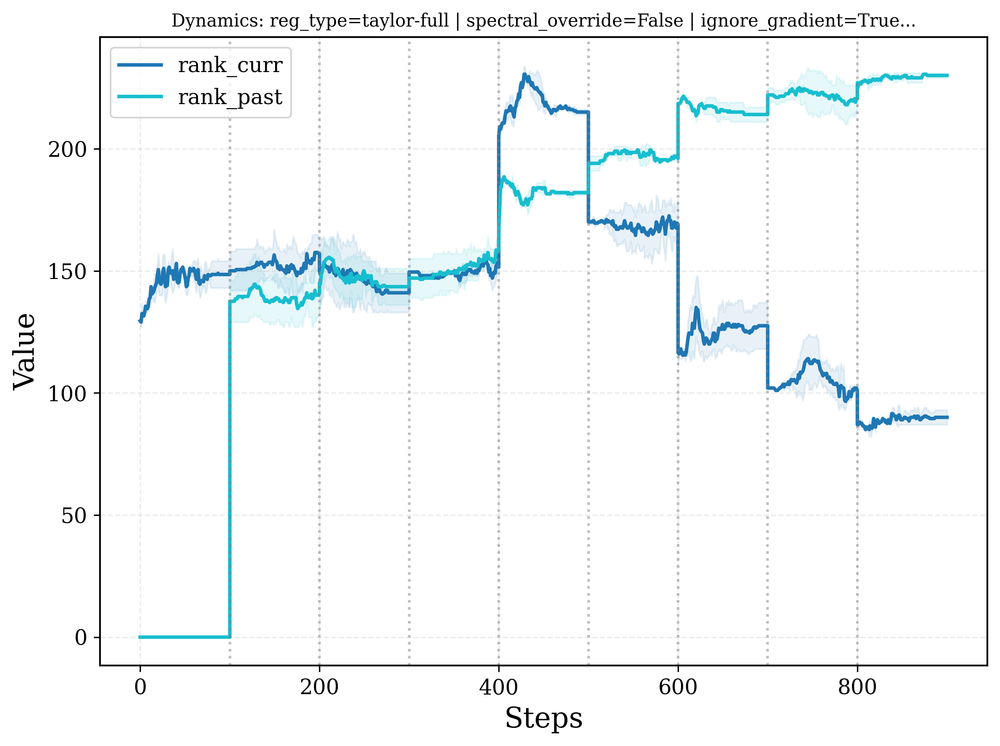

Indexing 180 experiments...
Plotting metrics ['rank_curr', 'rank_past'] for 3 seeds...


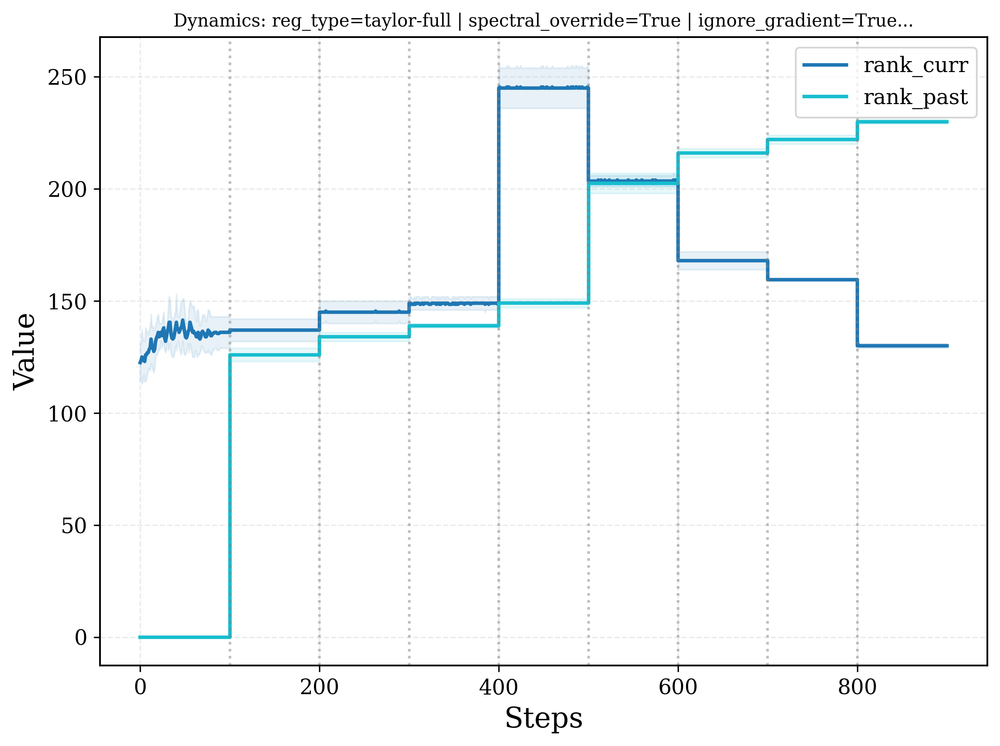

In [25]:
metrics_to_plot = ["rank_curr", "rank_past"]
plot_specific_experiment(ROOT_DIR, 
                        metrics_to_plot, # List of keys, e.g. ['grad_norm_task', 'grad_norm_reg']
                            # Filters
                        filters={
                            'reg_type': 'taylor-full',
                            'spectral_override': False, 
                            'ignore_gradient':True,
                            'curvature': 'true_fisher',
                            'mode':'regularized', 
                            'alpha': 1.0
                        })
plot_specific_experiment(ROOT_DIR, 
                        metrics_to_plot, # List of keys, e.g. ['grad_norm_task', 'grad_norm_reg']
                            # Filters
                        filters={
                            'reg_type': 'taylor-full',
                            'spectral_override': True, 
                            'ignore_gradient':True,
                            'curvature': 'true_fisher',
                            'mode':'regularized', 
                            'alpha': 1.0,
                            'projection': True
                        })

# Dataframe extractions

In [44]:
import torch
import matplotlib.patheffects as path_effects

def collect_results_to_df(filtered_index, metrics_to_collect):
    all_rows = []
    
    for exp in filtered_index:
        if not os.path.exists(exp['metrics_path']): continue
        try:
            results_data = torch.load(exp['metrics_path'], map_location='cpu', weights_only=False)
        except: continue
        
        cfg = exp['config']
        if not cfg['accumulate']:
            print(cfg)
        metadata = {
            'strategy': 'accumulate' if cfg.get('accumulate') else 'refresh',
            'mode': cfg['training_mode'],
            'curvature': cfg.get('curvature_type', 'fisher'),
            'data_rel': cfg.get('data_relationship', 'independent'),
            'seed': cfg['seed'],
            'reg_type': cfg['reg_type'],
            'data_relationship': cfg.get('data_relationship', 'independent'),
            'ignore_gradient': cfg.get('ignore_gradient', False),
            'spectral_override': cfg.get('spectral_override', False),
            'alpha': cfg.get('alpha', 1.0),
            'projection': cfg.get('projection', False),
            'reg_frac': cfg.get('reg_frac', 1.0),
            'replay_frac': cfg.get('replay_frac', 0.0)
        }


        # Extract all requested metrics for this experiment
        series_data = {}
        common_steps = None

        for m_root in metrics_to_collect:
            steps, v_s, v_f = extract_trajectory_series(results_data, cfg, m_root)
            # if m_root == 'test_avg_past':
            #     print(v_s)
            if len(steps) > 0:
                series_data[m_root] = (v_s, v_f)
                # We trust your check: steps are identical across metrics
                common_steps = steps 

        if common_steps is None: continue

        # Build rows
        for i, step in enumerate(common_steps):
            for approx in ['stale', 'fresh']:
                row = metadata.copy()
                row.update({
                    'step': step, 
                    'approx_type': approx, 
                    'task_idx': int(step // cfg['num_steps']+1)
                })
                
                # Fill in every metric for this specific step and version
                for m_root, (v_s, v_f) in series_data.items():
                    row[m_root] = v_s[i] if approx == 'stale' else v_f[i]
                
                all_rows.append(row)

    return pd.DataFrame(all_rows)

In [62]:
# Index everything
full_index = get_experiment_index("./results")
# 1. Define the updated metrics list
# We use the systematic test set metrics we just implemented
metrics = ['test_avg_past', 'test_current', 'kappa_loss', 'kappa_grad']

# 2. Filter for the specific experiment setup
# Note: Ensure these keys match what get_experiment_index() extracts
my_filters = {
    'mode': 'regularized',
    'reg_type': 'taylor-full',
    'curvature': 'true_fisher'
    # 'data_rel': 'independent' # Optional: filter by data overlap strategy
}

filtered = filter_index(full_index, my_filters)
sub_df = collect_results_to_df(filtered, metrics)

# --- STATS CALCULATION ---

# 3. Calculate "Last Step" Stats
# Find the final step recorded for each seed
last_step_idx = sub_df.groupby(['strategy', 'seed', 'approx_type'])['step'].idxmax()
df_last = sub_df.loc[last_step_idx]

# Aggregate across seeds (Grouping by strategy: Accumulate vs Refresh)
stats_last = df_last.groupby(['strategy', 'approx_type'])[metrics].agg(['mean', 'std'])

# 4. Calculate "Trajectory Average" Stats
# First: Average across steps for EACH seed individually
traj_means_per_seed = sub_df.groupby(['strategy', 'approx_type', 'seed'])[metrics].mean().reset_index()

# Second: Aggregate those seed-means across seeds
stats_traj = traj_means_per_seed.groupby(['strategy', 'approx_type'])[metrics].agg(['mean', 'std'])

# 5. Combine into one summary table
summary = pd.concat([stats_last, stats_traj], axis=1, keys=['Final Step', 'Trajectory Avg'])

# Cleanup: Keep only the specific Strategy/Approx pairs we care about
# Accumulate -> Stale (how it actually ran)
# Refresh -> Fresh (how it actually ran)
final_table = summary.loc[[('accumulate', 'stale'), ('refresh', 'fresh')]]

print(final_table.round(4))

Indexing 67 experiments...
{'reg_type': 'taylor-full', 'accumulate': False, 'curvature_type': 'true_fisher', 'ignore_gradient': True, 'spectral_threshold': 0.99999, 'spectral_override': False, 'spectral_rank': 200, 'hard_spectral_cut': False, 'projection': False, 'environment': '2d_classification', 'environment_args': {'train_ratio': 0.8, 'npz_file': 'sine_dataset_10.npz', 'root': '../datasets/synthetic/', 'num_tasks': 9}, 'alpha': 1.0, 'num_steps': 100, 'reg_frac': 0.1, 'replay_frac': 0.1, 'data_relationship': 'shared', 'batch_size': 32, 'optimizer': {'name': 'adam', 'lr': 0.01, 'warmup_on': False, 'weight_decay': 0.001}, 'scheduler': {'name': 'cosine_anneal', 'eps': '1e-8', 'patience': 20, 'steps_per_task': 100}, 'network': {'name': 'MLP', 'depth': 1, 'width': 250, 'activation': 'relu', 'num_classes_total': 2}, 'loss': 'CE', 'log_every_n_steps': 1, 'landscape_interval': 1, 'save_initial_artifacts': False, 'seed': 13, 'device': 'cuda', 'exp_name': 'study_q2approx_v1', 'training_mode':

In [43]:
sub_df.loc[sub_df['strategy'] == 'refresh']['seed'].unique()

array([13])

In [63]:
for d in full_index: 
    if not d['accumulate']: 
        print(d['seed'])

13
33
13
13
33
13
33
13
33
33
13
33
13
33
13
13
13
13
33
13
33
13
33
13
33
33
13
13
33
33
13
33
13


In [56]:
# L_metrics = ["sharpness_curr", "trace_curr", "sharpness_past", "trace_past", "grad_cos_sim", "grad_norm_reg", "grad_norm_task", "rank_curr", "rank_fraction_curr", "rank_past", "rank_fraction_past", "reg_rank"]
# P_metrics = ["accuracy", "task_loss", "reg_loss", "all_accuracy", "reg_accuracy"]

# Analysis of the alignment hypothesis 

In [34]:
def extract_geometry_series(results, config, metric_key, rank_idx=0, smooth_window=1):
    """
    Extracts a time series for a specific eigenvector rank.
    metric_key: 'alignments_with_top_eigs' OR 'projections_along_top_eigs'
    """
    num_tasks = config['environment_args']['num_tasks']
    num_steps = config['num_steps']
    
    steps_axis = []
    values = []
    curr_step = 0
    
    for t in range(1, num_tasks):
        if t not in results or metric_key not in results[t]:
            # Fill gaps to keep timeline consistent
            dummy_steps = np.linspace(0, num_steps, num_steps)
            steps_axis.extend(curr_step + dummy_steps)
            values.extend([np.nan] * len(dummy_steps))
            curr_step += num_steps
            continue
            
        raw_history = results[t][metric_key]
        actual_steps = len(raw_history)
        task_x = np.linspace(0, num_steps, actual_steps)
        
        for i, scores in enumerate(raw_history):
            steps_axis.append(curr_step + task_x[i])
            # Extract Rank
            val = 0.0
            if isinstance(scores, list) and len(scores) > rank_idx:
                val = scores[rank_idx]
            elif isinstance(scores, (float, np.floating)):
                val = scores # Fallback if scalar
                
            # If projection, we usually want magnitude for cleaner plots
            if 'projection' in metric_key:
                val = abs(val)
                
            values.append(val)

        curr_step += num_steps
        
    # Smoothing (Optional, mostly for Alignment which is noisy)
    vals_arr = np.array(values)
    if smooth_window > 1 and len(vals_arr) > smooth_window:
        kernel = np.ones(smooth_window) / smooth_window
        vals_arr = np.convolve(np.nan_to_num(vals_arr), kernel, mode='same')
        
    return np.array(steps_axis), vals_arr

In [ ]:
def plot_geometry_analysis(root_dir, 
                           ranks_to_plot=[0, 4, 9], # e.g. Rank 1, 5, 10
                           filters={}, # <--- Generalized Filters
                           seed=None, # None=Aggregate, Int=Specific
                           # --- Visuals ---
                           smooth_align=50):
    
    # 1. Prepare Filters
    index = get_experiment_index(root_dir)
    matches = filter_index(index, filters)
    
    # Filter by seed explicitly if needed
    if seed is not None:
        matches = [m for m in matches if m.get('seed') == seed]
            
    if not matches:
        print(f"No experiments found for filters: {filters}")
        return

    print(f"Plotting Geometry Analysis for {len(matches)} seeds...")

    # 2. Setup 2 Subplots (Vertical Layout as in your snippet)
    fig, axes = plt.subplots(2, 1, figsize=(10, 10), dpi=300)
    
    # Define Colors (Rank 1 = Dark Purple, Rank N = Yellow)
    colors = plt.cm.viridis(np.linspace(0, 0.9, len(ranks_to_plot)))
    
    metrics = [
        ('alignments_with_top_eigs', axes[0], 'Optimizer Alignment (Velocity)', 0.0, 1.0, smooth_align),
        ('projections_along_top_eigs', axes[1], 'Cumulative Drift (Position)', 0.0, None, 1) # No smoothing for drift
    ]

    for metric_key, ax, title, y_min, y_max, smooth in metrics:
        
        for i, rank_idx in enumerate(ranks_to_plot):
            color = colors[i]
            
            # Aggregate across seeds
            all_series = []
            steps_ref = None
            
            for m in matches:
                try:
                    res = torch.load(m['metrics_path'], map_location='cpu', weights_only=False)
                    # Note: Assumes extract_geometry_series is defined (from previous steps)
                    steps, vals = extract_geometry_series(res, m['config'], metric_key, rank_idx, smooth)
                    
                    if steps_ref is None: steps_ref = steps
                    elif len(steps) != len(steps_ref):
                        mn = min(len(steps), len(steps_ref))
                        steps = steps[:mn]; vals = vals[:mn]
                        steps_ref = steps_ref[:mn]
                        all_series = [x[:mn] for x in all_series]
                        
                    all_series.append(vals)
                except: continue
                
            if not all_series: continue
            
            # Stats
            mat = np.vstack(all_series)
            mean_line = np.nanmean(mat, axis=0)
            
            # Plot Line
            ax.plot(steps_ref, mean_line, color=color, lw=2, label=f"Rank {rank_idx+1}")
            
            # Shading (only if aggregating)
            if seed is None and len(matches) > 1:
                std_line = np.nanstd(mat, axis=0)
                ax.fill_between(steps_ref, mean_line-std_line, mean_line+std_line, color=color, alpha=0.1)

        # Formatting per subplot
        ax.set_title(title, fontsize=12)
        ax.set_xlabel("Global Steps")
        
        # Scaling (optional, currently commented out based on your snippet)
        # if y_max is not None: ax.set_ylim(y_min, y_max)
        # else: ax.set_ylim(bottom=y_min)
        ax.set_ylim(-1, 1)

        # Task Boundaries
        if matches:
            cfg = matches[0]['config']
            num_tasks = cfg['environment_args']['num_tasks']
            num_steps = cfg['num_steps']
            for t in range(1, num_tasks):
                ax.axvline(x=t*num_steps, color='gray', ls=':', alpha=0.3)
        
        ax.grid(True, alpha=0.3)

    # Legend (Shared on bottom plot)
    axes[1].legend(loc='upper right', title="Eigenvector Rank\n(High Curv $\\to$ Low)")
    
    # Main Title Generation
    title_parts = [f"{k}={v}" for k, v in filters.items()]
    if len(title_parts) > 3:
        title_str = " | ".join(title_parts[:3]) + "..."
    else:
        title_str = " | ".join(title_parts)
        
    seed_txt = f"Seed {seed}" if seed is not None else f"Avg {len(matches)} Seeds"
    fig.suptitle(f"Geometry Analysis: {title_str} | {seed_txt}", fontsize=14)
    
    plt.tight_layout()
    plt.show()

Indexing 165 experiments...
Plotting Geometry Analysis for 3 seeds...


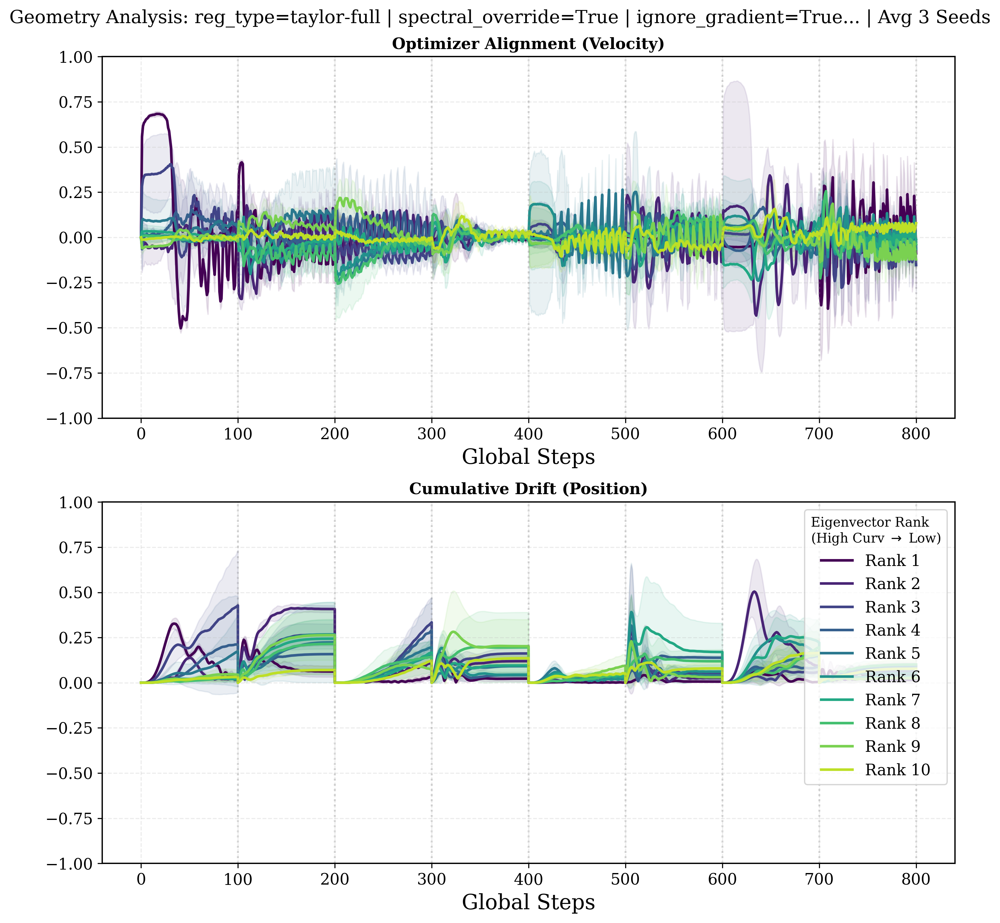

Indexing 165 experiments...
Plotting Geometry Analysis for 3 seeds...


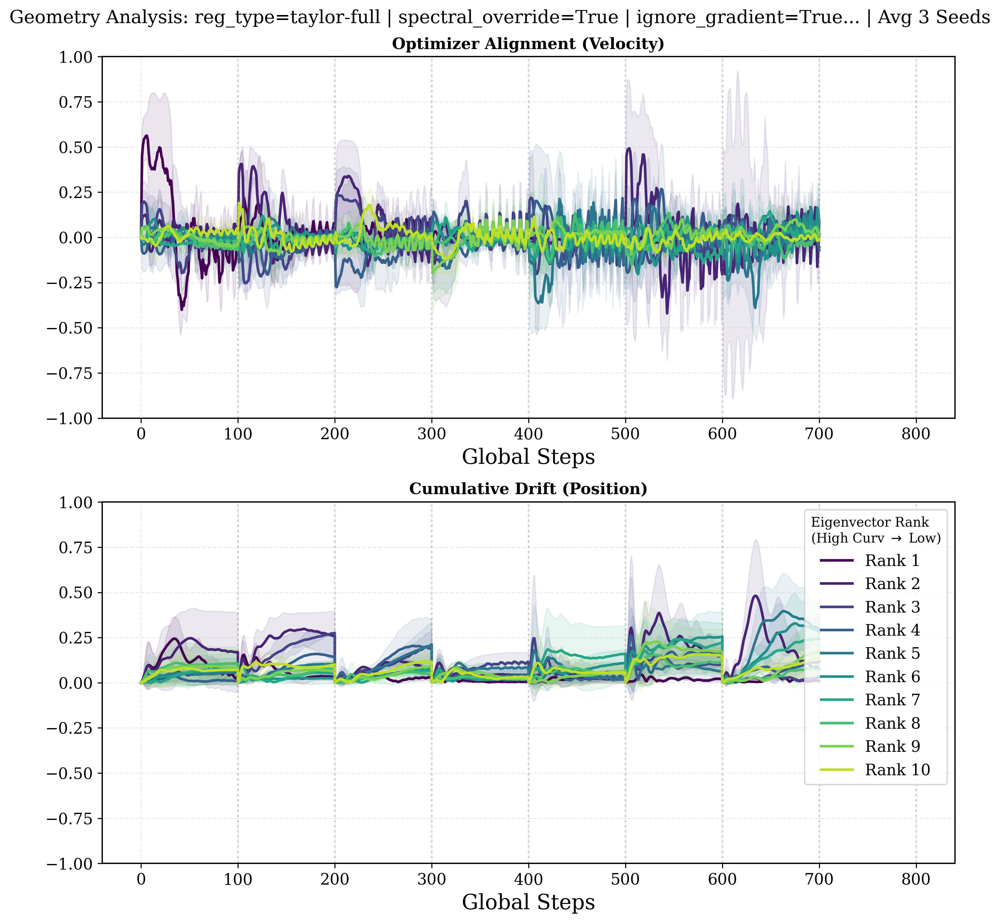

In [39]:
plot_geometry_analysis(
    ROOT_DIR,
    ranks_to_plot=list(range(10)),
    filters={
        'reg_type': 'taylor-full',
        'spectral_override': True, 
        'ignore_gradient':True,
        'curvature': 'fisher',
        'mode':'regularized', 
        'alpha': 1.0
    },
    smooth_align=1
)
plot_geometry_analysis(
    ROOT_DIR,
    ranks_to_plot=list(range(10)),
    filters={
        'reg_type': 'taylor-full',
        'spectral_override': True, 
        'ignore_gradient':True,
        'curvature': 'true_fisher',
        'mode':'regularized', 
        'alpha': 1.0
    },
    smooth_align=1
)

Indexing 144 experiments...
Plotting Geometry Analysis for 3 seeds...


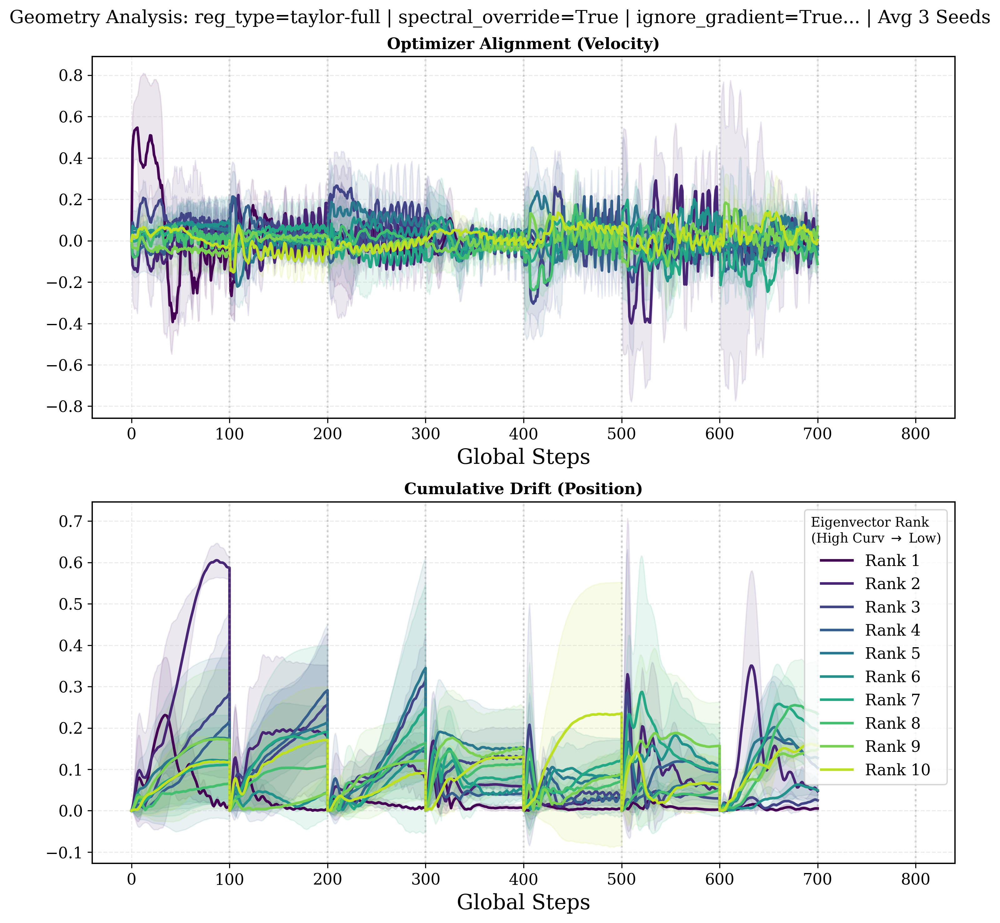

In [39]:
plot_geometry_analysis(
    ROOT_DIR,
    ranks_to_plot=list(range(10)),
    filters={
        'reg_type': 'taylor-full',
        'spectral_override': True, 
        'ignore_gradient':True,
        'curvature': 'true_fisher',
        'mode':'regularized', 
        'alpha': 1.0
    },
    smooth_align=1
)

Indexing 144 experiments...
Plotting Geometry Analysis for 3 seeds...


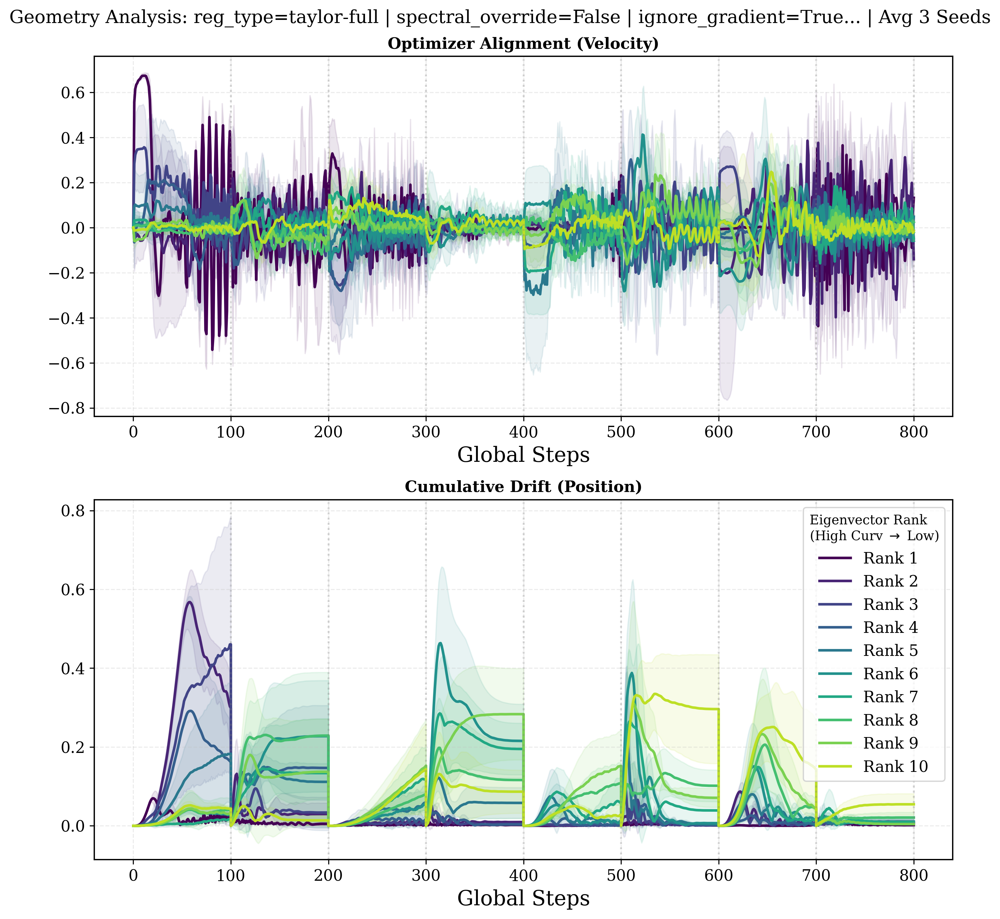

In [42]:
plot_geometry_analysis(
    ROOT_DIR,
    ranks_to_plot=list(range(10)),
    filters={
        'reg_type': 'taylor-full',
        'spectral_override': False, 
        'ignore_gradient':True,
        'curvature': 'fisher',
        'mode':'regularized', 
        'alpha': 1.0
    },
    smooth_align=1
)

Indexing 98 experiments...
Plotting Geometry Analysis for 1 seeds...


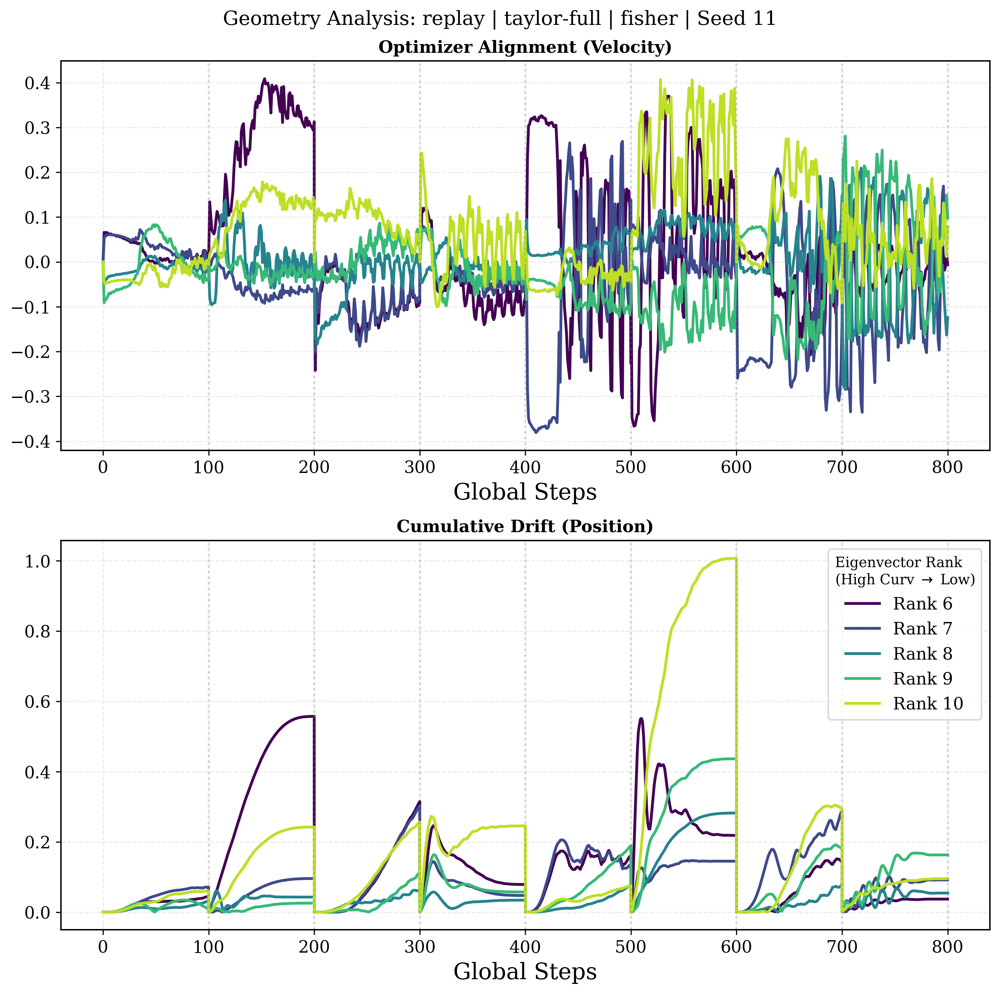

In [67]:
plot_geometry_analysis(
    ROOT_DIR,
    ranks_to_plot=list(range(5,10)), # Top-1, Top-5, Top-10
    mode='replay',
    reg_type='taylor-full',
    curvature='fisher',
    alpha=1.0,
    seed=11, # Aggregate all seeds,
    ignore_gradient=True,
    smooth_align=1
)